<a href="https://colab.research.google.com/github/juanfrans-courses/threads-storytelling-with-maps-and-data/blob/main/03_Basic_GIS_Concepts/Basic_Concepts_Part_1_Spatial_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Basic concepts part 1 - Types of spatial data

**Threads - Storytelling with Maps and Data (Spring 2025)**

## Types of spatial data and files

To understand the types of data and layers we will be using throughout the course, let's take a step back and talk about the main types of files that make up the GIS stack. There are three main types of layers in GIS:

* **Data**:
  * This includes `csv`, `excel`, `json`, and `text` files.
  * These files might or might not have any geographical data: they might come with `latitude` and `longitude` fields, with addresses, or with an attribute that might allow us to join them to another file that does contain spatial attributes.
* **Raster**:
  * Raster files are made out of pixels. Each pixel has one or more specific values.
  * These values can represent any type of data, like elevation (the most common), population, pollution or temperature.
  * Raster datasets can come as single-band or multi-band files. Multi-band files are actually just a series of files (3, 5, 8, 11, there's no precise number of bands) that cover the same area, with pixels overlapping perfectly. In each band, the values associated with the pixels represent something different. We'll talk more about this later.
* **Vector**:
  * These are the most common GIS files.
  * You've already used these in the previous tutorial (ie. turnstile and median household income files).
  * Vector files can come as **points**, **lines** or **polygons**, and they will usually contain other data associated with them. This can be any type of data: just imagine an Excel spreadsheet where every row is tied to a geometrical feature.
  * Vector files can come in the form of `Shapefiles` (the most common), `GeoJSON` (increasingly common), and `GeoPackage`, among others.

### Data Files

Let's start with some data files. Here is, for example, a `csv` file with `latitude` and `longintud` fields. This file comes from the [Chicago Data Portal](https://data.cityofchicago.org/).

In [2]:
import pandas as pd
import numpy as np

In [3]:
chicagoSpeedCameras = pd.read_csv('https://data.cityofchicago.org/api/views/4i42-qv3h/rows.csv')

In [4]:
chicagoSpeedCameras.head()

,ID,LOCATION ID,ADDRESS,FIRST APPROACH,SECOND APPROACH,GO-LIVE DATE,LATITUDE,LONGITUDE,LOCATION
0,195,CHI015,3450 W 71st St,WB,EB,09/06/2013,41.7644,-87.7097,"(41.7644, -87.7097)"
1,232,CHI039,6247 W Fullerton Ave,EB,NaN,12/21/2013,41.9236,-87.7825,"(41.9236, -87.7825)"
2,233,CHI040,6250 W Fullerton Ave,WB,NaN,12/21/2013,41.9238,-87.7826,"(41.9238, -87.7826)"
3,227,CHI041,5509 W Fullerton Ave,EB,NaN,12/12/2013,41.9239,-87.7639,"(41.9239, -87.7639)"
4,226,CHI042,5446 W Fullerton Ave,WB,NaN,12/12/2013,41.9241,-87.7630,"(41.9241, -87.763)"


In order to use this file for spatial analysis we need to first convert it to a `GeoDataFrame`. We do, of course, through Geopandas.

Note that we will use the `gpd` alias to refer to Geopandas.

In [5]:
import geopandas as gpd

Now, converting a `DataFrame` with `lat` and `lon` to a `GeoDataFrame` is easy:

In [6]:
chicagoSpeedCamerasGeo = gpd.GeoDataFrame(chicagoSpeedCameras, geometry=gpd.points_from_xy(chicagoSpeedCameras.LONGITUDE, chicagoSpeedCameras.LATITUDE))

We can either specify the Coordinate Reference System (`EPSG`) or if we leave it blank it will default to WGS 1984. Since this is the most common, it makes sense for it to be the default. However, always make sure you know which Coordinate Reference System your data is using.

Note the new `geometry` field. This is the distictive feature for all `GeoDataFrames`: we are creating it in the function above and we can see it when we print the `head` of the new `GeoDataFrame`.

In [7]:
chicagoSpeedCamerasGeo.head()

,ID,LOCATION ID,ADDRESS,FIRST APPROACH,SECOND APPROACH,GO-LIVE DATE,LATITUDE,LONGITUDE,LOCATION,geometry
0,195,CHI015,3450 W 71st St,WB,EB,09/06/2013,41.7644,-87.7097,"(41.7644, -87.7097)",POINT (-87.7097 41.7644)
1,232,CHI039,6247 W Fullerton Ave,EB,NaN,12/21/2013,41.9236,-87.7825,"(41.9236, -87.7825)",POINT (-87.7825 41.9236)
2,233,CHI040,6250 W Fullerton Ave,WB,NaN,12/21/2013,41.9238,-87.7826,"(41.9238, -87.7826)",POINT (-87.7826 41.9238)
3,227,CHI041,5509 W Fullerton Ave,EB,NaN,12/12/2013,41.9239,-87.7639,"(41.9239, -87.7639)",POINT (-87.7639 41.9239)
4,226,CHI042,5446 W Fullerton Ave,WB,NaN,12/12/2013,41.9241,-87.7630,"(41.9241, -87.763)",POINT (-87.763 41.9241)


Note: when working with files that have an `X` and `Y` field, instead of `latitude` and `longitude`, make sure you choose the `Y` field as the `latitude` and the `X` field as the `longitude` (this always trips me up).

Once you have the `GeoDataFrame` you can easily map it with Altair.

In [9]:
import altair as alt

In [10]:
alt.Chart(chicagoSpeedCamerasGeo).mark_geoshape().encode(
    color=alt.Color('GO-LIVE DATE:T', title='Go-Live Date', scale=alt.Scale(scheme='inferno')),
    tooltip=['GO-LIVE DATE:T','FIRST APPROACH','SECOND APPROACH'],
).properties(
    title='Chicago Speed Cameras'
).configure_view(
    strokeWidth=0
)

alt.Chart(...)

This is one of the best case scenarios: a clean file with precise location data in coordinates. But it won't always be this easy.

Another classic example of text file that contains geographic information is a `csv` or `txt` file with **addresses** such as this one, coming from the [Paris Open Data portal](https://opendata.paris.fr/pages/home/):

In [11]:
chargingStationsParis = pd.read_csv('https://opendata.paris.fr/explore/dataset/belib-points-de-recharge-pour-vehicules-electriques-disponibilite-temps-reel/download/?format=csv&timezone=Europe/Paris&lang=fr&use_labels_for_header=true', delimiter=';')

In [12]:
chargingStationsParis.head()

,ID PDC local,Statut du point de recharge,URL Description Point de charge,Heure mise à jour,coordonneesXY,adresse_station,code_insee_commune,arrondissement
0,FR*V75*EPX09*09*4,Disponible,https://parisdata.opendatasoft.com/explore/dat...,2025-01-06T08:19:39+01:00,"48.875465,2.342083",56 Rue la Fayette 75009 Paris,75109.0,09e Arrondissement
1,FR*V75*EPX19*01*1,Disponible,https://parisdata.opendatasoft.com/explore/dat...,2025-01-06T07:42:09+01:00,"48.879482,2.388647",304 Rue Botzaris 75019 Paris,75119.0,19e Arrondissement
2,FR*V75*EPX13*18*4,Occupé (en charge),https://parisdata.opendatasoft.com/explore/dat...,2025-01-06T08:25:26+01:00,"48.832825,2.36241",143 boulevard Vincent Auriol 75013 Paris,75113.0,13e Arrondissement
3,FR*V75*EPX19*08*6,Disponible,https://parisdata.opendatasoft.com/explore/dat...,2025-01-06T08:12:39+01:00,"48.8818,2.3938",54 Rue David d'Angers 75019 Paris,75119.0,19e Arrondissement
4,FR*V75*EPX13*16*1,Occupé (en charge),https://parisdata.opendatasoft.com/explore/dat...,2025-01-06T08:22:38+01:00,"48.826084,2.358049",145 Rue de Tolbiac 75013 Paris,75113.0,13e Arrondissement


This one though we can't automatically convert it to a `GeoDataFrame`. We could if we took the `coordonneesXY` field and split it into individual columns, but that's beside the point of this example.

To convert **addresses** to geographic coordinates and then a `GeoDataFrame` we need to go through a process called **geocoding**. We will talk about this process much more in a later session.

So this type of file does have geographic information, but it needs further processing.

Another common type of data files we will use in mapping and spatial analysis is a `csv` or `txt` file containing some **geographic code**. This code, although not geometric itself, can be joined to another file that has a geometry, and thus will provide the data attributes for those geographic features.

The most common example of this type of file is a table from the US Census Bureau containing a **FIPS code**. We will often download the table, along with a shapefile with spatial information, and join the two using the FIPS code.

Just know that you need to be careful to have the two code fields be of the **same data type**. Oftentimes, one file will have the code as a `string` and the other will have it as an `integer`. In those cases, the codes won't match and you will be left wondering why. This is specially true if, for some strange reason one of the files made its way through Excel :P

Here's an example of such files, not from the census:

In [13]:
taxLots = pd.read_csv('https://data.cityofnewyork.us/api/views/fdkv-4t4z/rows.csv')

/var/folders/zx/0qxc7l052xb8t5p65sn_yj3r0000gn/T/ipykernel_7604/685817513.py:1: DtypeWarning: Columns (7,9,10,11,13) have mixed types. Specify dtype option on import or set low_memory=False.
  taxLots = pd.read_csv('https://data.cityofnewyork.us/api/views/fdkv-4t4z/rows.csv')


In [14]:
taxLots.head()

,Borough Code,Tax Block,Tax Lot,BBL,Zoning District 1,Zoning District 2,Zoning District 3,Zoning District 4,Commercial Overlay 1,Commercial Overlay 2,Special District 1,Special District 2,Special District 3,Limited Height District,Zoning Map Number,Zoning Map Code
0,1,1,10,1000010010,R3-2,C4-1,NaN,NaN,NaN,NaN,GI,NaN,NaN,NaN,16A,Y
1,1,1,101,1000010101,R3-2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16A,NaN
2,1,1,111,1000010111,R3-2,NaN,NaN,NaN,NaN,NaN,GI,NaN,NaN,NaN,16A,NaN
3,1,1,112,1000010112,R3-2,NaN,NaN,NaN,NaN,NaN,GI,NaN,NaN,NaN,16A,NaN
4,1,1,150,1000010150,R3-2,NaN,NaN,NaN,NaN,NaN,GI,NaN,NaN,NaN,16A,NaN


The file above comes from the [NYC Zoning Tax Lot database](https://data.cityofnewyork.us/City-Government/NYC-Zoning-Tax-Lot-Database/fdkv-4t4z), and although it does not contain any geometry field it does have a `BBL` field, which you can join to multiple other lot geographic datasets that have the same field.

Just for reference, `BBL` stands for `Borough` / `Block` / `Lot`.

### Raster Files

As we said above, raster files are made out of a grid of cells (called pixels). At its most fundamental level each pixel contains a **single value**, representing any kind of data, be it elevation, population, temperature, or anything else.

![Raster image and detail](https://desktop.arcgis.com/en/arcmap/10.3/manage-data/raster-and-images/GUID-6754AF39-CDE9-4F9D-8C3A-D59D93059BDD-web.png)

The most common type of raster files are satellite images, in which each pixel contains an `RGB` value, taken directly from the surface of the earth. However, satellite images are so much more than that.

Raster files are often use in the following cases:

* Just as an image, to act as a background or base map.
* To represent continious data, such as temperature, pollution, or elevation.
* To represent discrete data, such as land use, or vegetation type.

Let's import a an example raster file.

First, we need to `install` and `import` [Rasterio](https://rasterio.readthedocs.io/en/latest/index.html), one of the Python libraries we can use to read and write raster files.

In [16]:
!pip install rasterio
import rasterio


[notice] A new release of pip is available: 23.0.1 -> 25.0.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


Here's a digital elevation model (DEM) from [Cornell's catalog of the U.S. Geological Survey](https://cugir.library.cornell.edu/catalog/cugir-008186).

In [17]:
centralParkDem = rasterio.open('https://brown-institute-assets.s3.amazonaws.com/Objects/pointsunknown/2021_Summer/Data/hh47elu.dem')

And here is its metadata:

In [18]:
centralParkDem.meta

{'driver': 'USGSDEM',
 'dtype': 'float32',
 'nodata': -32767.0,
 'width': 1071,
 'height': 1402,
 'count': 1,
 'crs': CRS.from_wkt('PROJCS["unnamed",GEOGCS["NAD27",DATUM["North_American_Datum_1927",SPHEROID["Clarke 1866",6378206.4,294.978698213898,AUTHORITY["EPSG","7008"]],AUTHORITY["EPSG","6267"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4267"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",-75],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'),
 'transform': Affine(10.0, 0.0, 584265.0,
        0.0, -10.0, 4525285.0)}

We get the number of bands (`'count': 1`), the coordinate reference system (`'crs': CRS...`), the height and the width (`1402` x `1071`), as well as its geospatial transformation (`Affine(10.0, 0.0, 584265.0, 0.0, -10.0, 4525285.0)`.

We can even print it's actual values. In this case, the values represent elevation over sea level (in meters).

In [19]:
centralParkDem.read(1)

Warning 1: HTTP response code on https://brown-institute-assets.s3.amazonaws.com/Objects/pointsunknown/2021_Summer/Data/hh47elu.dem.msk: 403
Warning 1: HTTP response code on https://brown-institute-assets.s3.amazonaws.com/Objects/pointsunknown/2021_Summer/Data/hh47elu.dem.MSK: 403


array([[-32767., -32767., -32767., ..., -32767., -32767., -32767.],
       [-32767., -32767., -32767., ..., -32767., -32767., -32767.],
       [-32767., -32767., -32767., ..., -32767., -32767., -32767.],
       ...,
       [-32767., -32767., -32767., ..., -32767., -32767., -32767.],
       [-32767., -32767., -32767., ..., -32767., -32767., -32767.],
       [-32767., -32767., -32767., ..., -32767., -32767., -32767.]],
      dtype=float32)

We can get the maximum and the minimum values:

In [20]:
print('Max value:',np.amax(centralParkDem.read(1)))
print('Min value:',np.amin(centralParkDem.read(1)))

Max value: 113.8
Min value: -32767.0


Now, here, having a minimum value of -32,767 meters doesn't make any sense, of course. And you have to be careful with this. Probably, this is the value they used to indicate no elevation.

Let's plot it to see how it looks.

First, we should import Rasterio's plotting module:

In [21]:
from rasterio.plot import show

Matplotlib is building the font cache; this may take a moment.


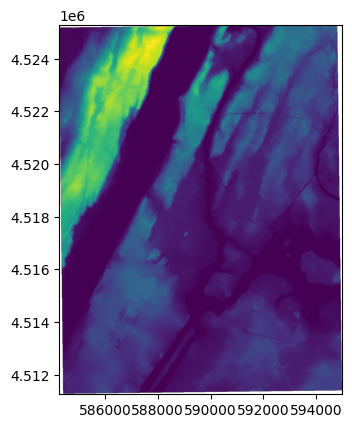

<Axes: >

In [23]:
show(centralParkDem, cmap='viridis')

Note that in this raster each pixel has an approximate resolution of 10 meters (10 x 10).

So why rasters?

* First, because many datasets already come in that format. This is specially true of satellite images, and digital elevation models (which includes bathymetry).
* Second, because rasters have an extremely simple and uniform structure: a grid of cells, all of them of equal width and height, enconding just one value.
* Third, because in many cases its regular structure allows you to perform fast analysis on complex datasets.

But rasters also have their drawbacks:

* They can often be extremely large files, difficult to load and handle withiout powerful machines. For example, a single Landsat satellite image can often be hundreds of mega bytes in size.
* In addition, because of their regular structure, they often oversimplify features, introducing spatial inaccuracies and loss of precission.

If you ever find yourself needing to work with raster data I recommend taking a look at [Google Earth Engine](https://earthengine.google.com/) which has an incredible catalogue of raster data ready to be accessed, an extensive library of algorithms to analyze them, great computation power and an active and helpful community to help you figure out things.

### Vector Files

Vector files are the bread and butter of mapping and spatial analysis. As opposed to rasters, vector files are not made out of a grid pixels, and can encode multiple values at the same time.

In addition, vector files are not just used for mapping. Adobe Illustrator uses vector files, as does your web browser when loading `svg` files. Here's Adobe's quick definition of a vector file:

> Vector files are images that are built by mathematical formulas that establish points on a grid. Raster files are composed of the colored blocks commonly referred to as pixels. Because they can infinitely adjust in size without losing resolution, vector files are more versatile for certain types of tasks than raster files.

In mapping and spatial analysis vector files almost always come with an `attribute table`, which contains the data associated with each geographic feature.

There are many different types of vector files but the most common are `Shapefiles` and `GeoJSONs`. Let's talk in detail about these two.

#### GeoJSONs

GeoJSONs are just an expanded version of the common JSON files. As you might know, JSON stands for JavaScript Object Notation and it's a **human readable** file format that uses `attribute-value` pairs as well as `arrays` to store data. If you haven't already, you will probably encounter this type of file format a million times in your mapping work.

What makes a GeoJSON different than a simple JSON file is the presence of a few standard attributes:

* Every feature in a GeoJSON file will always have a `geometry` field, which will contain its `coordinates` and its `type`. The type can be `point`, `linestring`, `polygon`, or their multi-part equivalents.
* In addition, the whole GeoJSON file will often contain a top-level attribute with it's coordinate reference system.

Although we can easily load a GeoJSON through Geopandas, and that's what we will do most of the time, to give you a better sense of what these files look like here we will import it into a regular python variable and `print` it.

But first we need to load two libraries:

* `requests` will allow us to `get` a file from a URL
* `json` will allow us to read the file as a `json`



In [25]:
import requests
import json

Let's load a dataset of [properties leased or owned by the city of New York](https://www1.nyc.gov/site/planning/data-maps/open-data.page#city_facilities).

In [26]:
geoJsonFile = requests.get('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/COLP/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=geojson')
cityProperties = json.loads(geoJsonFile.content)

Printing the `type` of this variable will tell us that it's a `dict` (short for dictionary). As you probably know `JSON` objects are treated as dictionaries.

In [27]:
print(type(cityProperties))

<class 'dict'>


A dictionary is made out of `attribute-value` pairs and arrays. The attributes are also called `keys`, and that's what we will use to get the values out.

Let's see what attributes are included at the top level of this GeoJSON:

In [28]:
cityProperties.keys()

dict_keys(['type', 'crs', 'properties', 'features'])

And let's print the `type`, and `crs` values:

In [29]:
print('Type:', cityProperties['type'])
print('Coordinate reference system:', cityProperties['crs'])

Type: FeatureCollection
Coordinate reference system: {'type': 'name', 'properties': {'name': 'EPSG:4326'}}


Some varialbes in the dictionary are dictionaries themselves, like the `crs` variable. However, some of them are arrays, like the `features` one.

In [30]:
type(cityProperties['features'])

list

In [31]:
len(cityProperties['features'])

2000

There are 2,000 features in this GeoJSON. Note that this is probably because the server has a maximum limit of 2,000 features, not because there are only 2,000 properties leased or owned by the city of New York.

Let's print the first feature to see what it contains:

In [32]:
cityProperties['features'][0]

{'type': 'Feature',
 'id': 1,
 'geometry': {'type': 'Point',
  'coordinates': [-73.8784794055152, 40.6774582539247]},
 'properties': {'OBJECTID': 1,
  'uid': '00009e663e23b087adad08d9e91477df',
  'BOROUGH': '3',
  'BLOCK': 3976,
  'LOT': 1,
  'BBL': 3039760001,
  'MAPBBL': 3039760001,
  'CD': 305,
  'HNUM': '85',
  'SNAME': 'MONTAUK AVENUE',
  'ADDRESS': '85 MONTAUK AVENUE',
  'PARCELNAME': 'SHIELD OF FAITH GARDEN',
  'AGENCY': 'PARKS',
  'USECODE': '0472',
  'USETYPE': 'COMMUNITY GARDEN',
  'OWNERSHIP': 'C',
  'CATEGORY': 1,
  'EXPANDCAT': 3,
  'EXCATDESC': 'CULTURAL & RECREATIONAL USE',
  'LEASED': None,
  'FINALCOM': None,
  'AGREEMENT': None,
  'XCOORD': 1017957,
  'YCOORD': 186113,
  'LATITUDE': 40.67745,
  'LONGITUDE': -73.878478,
  'DCPEDITED': None}}

As you can see the first feature contains a `geometry` attribute of the `point` type, with it's respective `coordinates`. In addition, it also contains a bunch of other data, such as the `ADDRESS`, the `BBL` number, the `PARCEL NAME` and the `AGENCY` that owns or leases the property.

For every feature there should be the equivalent attributes. Let's print another at random to check.

In [33]:
from random import randrange
cityProperties['features'][randrange(len(cityProperties['features']))]

{'type': 'Feature',
 'id': 1079,
 'geometry': {'type': 'Point',
  'coordinates': [-73.8328923971161, 40.7793962755413]},
 'properties': {'OBJECTID': 1079,
  'uid': '0f4b6c6321f5648f9cc0ea5acfe75429',
  'BOROUGH': '4',
  'BLOCK': 4212,
  'LOT': 1,
  'BBL': 4042120001,
  'MAPBBL': 4042120001,
  'CD': 407,
  'HNUM': None,
  'SNAME': '135 STREET',
  'ADDRESS': '135 STREET',
  'PARCELNAME': 'FLUSHING AIRPORT',
  'AGENCY': 'EDC',
  'USECODE': '1510',
  'USETYPE': 'NO USE-NON RESIDENTIAL STRUCTURE',
  'OWNERSHIP': 'C',
  'CATEGORY': 3,
  'EXPANDCAT': 8,
  'EXCATDESC': 'PROPERTY WITH NO USE',
  'LEASED': None,
  'FINALCOM': 'D',
  'AGREEMENT': None,
  'XCOORD': 1030531,
  'YCOORD': 223273,
  'LATITUDE': 40.779388,
  'LONGITUDE': -73.832891,
  'DCPEDITED': None}}

Now let's quickly map this file. Let's import it directly with `geopandas` and plot it with `altair`.

In [34]:
cityPropertiesGeo = gpd.read_file('https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/COLP/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=geojson')

In [35]:
cityPropertiesGeo.head()

,OBJECTID,uid,BOROUGH,BLOCK,LOT,BBL,MAPBBL,CD,HNUM,SNAME,...,EXCATDESC,LEASED,FINALCOM,AGREEMENT,XCOORD,YCOORD,LATITUDE,LONGITUDE,DCPEDITED,geometry
0,1,00009e663e23b087adad08d9e91477df,3,3976,1,3039760001,3039760001,305.0,85,MONTAUK AVENUE,...,CULTURAL & RECREATIONAL USE,None,None,None,1017957,186113,40.677450,-73.878478,None,POINT (-73.87848 40.67746)
1,2,00018bbc777cdde96eaafbc4c1175a27,5,4781,10,5047810010,5047810010,503.0,89,FOX BEACH AVENUE,...,CULTURAL & RECREATIONAL USE,None,None,None,952584,140446,40.552111,-74.113949,None,POINT (-74.11395 40.55212)
2,3,00091162e1f190b1617e5fa7d0bcf5d4,4,9172,1,4091720001,4091720001,410.0,109-15,98 STREET,...,EDUCATIONAL USE,None,None,None,1028797,186384,40.678146,-73.839396,None,POINT (-73.8394 40.67815)
3,4,000b480f2dfbabe8f0883112498dbfea,5,7765,51,5077650051,5077650051,503.0,None,DAMON STREET,...,CULTURAL & RECREATIONAL USE,None,None,None,920725,126749,40.514345,-74.228464,None,POINT (-74.22847 40.51435)
4,5,000be7e47acf95d6a03839cbc498a4e7,4,8198,165,4081980165,4081980165,411.0,None,RUSHMORE AVENUE,...,PROPERTY WITH NO USE,None,None,None,1056051,217365,40.763002,-73.740808,None,POINT (-73.74081 40.76301)


In [36]:
cityPropertiesGeo['LEASED'].unique()

array([None, 'L'], dtype=object)

In [37]:
cityPropertiesGeo['LEASED'] = cityPropertiesGeo['LEASED'].replace('L', 'Leased')
cityPropertiesGeo['LEASED'] = cityPropertiesGeo['LEASED'].fillna('Owned')

In [38]:
alt.Chart(cityPropertiesGeo).mark_geoshape().encode(
    color=alt.Color('LEASED:N', legend=alt.Legend(title="Owned or Leased"), scale=alt.Scale(range=['gold','gray'])),
    tooltip=['ADDRESS','AGENCY','USETYPE','LEASED']
).properties(
    width=400,
    height=400,
    title='New York City Properties',
).configure_view(
    strokeWidth=0
).project(
    type='mercator'
)

alt.Chart(...)

This is in brief what a `GeoJSON` file looks like: everything is cointained in one file: the `type`, the `crs`, and for each `feature`, it's geographic information (coordinates) and its data.

The great advantage of `GeoJSON` files is that they are **human readable**. However, because of that they are usually much larger than `shapefiles`, the other super common vector file format.

#### TopoJSONs

Before we move into Shapefiles it's worth mentioning `TopoJSON` files. These are an extension of GeoJSONs, which function in a very similar way but are often much smaller. Here's a description from Mike Bostock who developed them:

![TopoJSON image](https://raw.githubusercontent.com/wiki/topojson/topojson/example.png)

> Rather than representing geometries discretely, geometries in TopoJSON files are stitched together from shared line segments called arcs... TopoJSON eliminates redundancy, allowing related geometries to be stored efficiently in the same file. For example, the shared boundary between California and Nevada is represented only once, rather than being duplicated for both states. A single TopoJSON file can contain multiple feature collections without duplication, such as states and counties. Or, a TopoJSON file can efficiently represent both polygons (for fill) and boundaries (for stroke) as two feature collections that share the same arc mesh.
>
> As a result, TopoJSON is substantially more compact than GeoJSON. The above shapefile of U.S. counties is 2.2M as a GeoJSON file, but only 436K as a boundary mesh, a reduction of 80.4% even without simplification. TopoJSON can also be more efficient to render since shared control points need only be projected once. To further reduce file size, TopoJSON uses fixed-precision delta-encoding for integer coordinates rather than floats... Like GeoJSON, TopoJSON files are easily modified in a text editor and amenable to gzip compression.
>
>Lastly, encoding topology has numerous useful applications for maps and visualization. It facilitates geometry simplification that preserves the connectedness of adjacent features; this applies even across feature collections, such as simultaneous consistent simplification of state and county boundaries. Topology can also be used for Dorling cartograms and other techniques that need shared boundary information.

As size is one of the main drawbacks of GeoJSON files, whenever you can it is useful to convert them to TopoJSON. There are a few [Python libraries](https://mattijn.github.io/topojson/) and [command line tools](https://github.com/topojson/topojson/blob/master/README.md#api-reference) to do this easily.

This [series of blog posts](https://medium.com/@mbostock/command-line-cartography-part-1-897aa8f8ca2c) by Mike Bostock will give you a great overview of some of these tools and techniques.

Just note that even though TopoJSONs can be easily read into a D3 map, they cannot be read into a Mapbox map. You can still use the TopoJSON advantages to vastly simplify the geometry but you will need to re-export your file as a traditional GeoJSON in order to load it into Mapbox. Unfortunately, this last step "destroys" the topology.

#### Shapefiles

Shapefiles are probably the most popular type of geospatial file. They were developed by ESRI for their ArcGIS program, and given this software's dominance of the GIS world, they have become the industry's standard file type.

Shapefiles are **small** and can be read by all the common GIS programs (ArcGIS, QGIS, Geopandas), but they are not **human readable**. In addition, a shapefile is **not** a single file; they are actually made out of 3 or more (sometimes up to 8 or 9) individual files. So you have to **be very careful when sending or moving shapefiles** as you might inadvertenly loose one of its components. This is why you will often find shapefiles zipped.

Here's a short breakdown of what each of the files does (taken from the main [ArcGIS documentation](https://desktop.arcgis.com/en/arcmap/10.3/manage-data/shapefiles/shapefile-file-extensions.htm)):

* Required files:
  * `.shp`: This is the main file that stores the geometry.
  * `.shx`: This file stores the index of the feature geometry.
  * `.dbf`: This is the dBASE table that stores the attribute information of features. There is a one-to-one relationship between geometry and attributes, which is based on record number. Attribute records in the dBASE file must be in the same order as records in the main file.

* Optional files:
  * `.sbn` and `.sbx`: These are the files that store the spatial index of the features. The spatial index helps speed up various geoprocessing operations, such as figuring out if a point is inside a polygon.
  * `.fbn` and `.fbx`: These are the files that store the spatial index of the features for shapefiles that are read-only.
  * `.ain` and `.aih`: These files store the attribute index of the active fields in a table or a theme's attribute table.
  * `.atx`: This file is created for each shapefile or dBASE attribute index created in ArcCatalog.
  * `.ixs`: This is a geocoding index for read/write shapefiles.
  * `.mxs`: This is a geocoding index for read/write shapefiles (ODB format).
  * `.prj`: This is the file that stores the coordinate system information.
  * `.xml`: This file contains the metadata with information about the shapefile.
  * `.cpg`: This file can be used to specify the codepage for identifying the characterset to be used.

Let's take a closer look at a `shapefile`. We would normally import it directly with `geopandas`, but here we will read it directly into a Python variable so you can actually see what it has inside.

Since the `shapefile` comes as a zip file we will import the `zipfile`, `requests` and `io` libraries to load it.

In [39]:
from zipfile import ZipFile
import requests
import io

Let's get a shapefile of New York's Neighborhood Tabulation Areas (NTAs).

In [40]:
ntaZipFile = requests.get('https://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nynta_20d.zip')
zipFiles = ZipFile(io.BytesIO(ntaZipFile.content))
for name in zipFiles.namelist():
  print(name)

nynta_20d/nynta.shp
nynta_20d/nynta.dbf
nynta_20d/nynta.shx
nynta_20d/nynta.prj
nynta_20d/nynta.shp.xml


We can see that the zip package contains 6 files. Let's print the contents of a few of those to see what's inside.

First the `.dbf` file, which contains the attribute table.

In [41]:
dbfFile = list(zipFiles.open('nynta_20d/nynta.dbf'))
print(dbfFile)

[b"\x03x\x0b\x10\xc3\x00\x00\x00\x01\x01\x8b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00BoroCode\x00\x00\x00N\x00\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00BoroName\x00\x00\x00C\x00\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00CountyFIPS\x00C\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00NTACode\x00\x00\x00\x00C\x00\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00NTAName\x00\x00\x00\x00C\x00\x00\x00\x00K\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Shape_Leng\x00F\x00\x00\x00\x00\x13\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Shape_Area\x00F\x00\x00\x00\x00\x13\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r     3Brooklyn     047BK88Borough Park                                                                 3.92472278309e+04  5.40050190480e+07     4Queens       081QN51Murray Hill    

And now the `.prj` file, which contains the coordinate reference system information.

In [42]:
prjFile = list(zipFiles.open('nynta_20d/nynta.prj'))
print(prjFile)

[b'PROJCS["NAD_1983_StatePlane_New_York_Long_Island_FIPS_3104_Feet",GEOGCS["GCS_North_American_1983",DATUM["D_North_American_1983",SPHEROID["GRS_1980",6378137.0,298.257222101]],PRIMEM["Greenwich",0.0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Conformal_Conic"],PARAMETER["False_Easting",984250.0],PARAMETER["False_Northing",0.0],PARAMETER["Central_Meridian",-74.0],PARAMETER["Standard_Parallel_1",40.66666666666666],PARAMETER["Standard_Parallel_2",41.03333333333333],PARAMETER["Latitude_Of_Origin",40.16666666666666],UNIT["Foot_US",0.3048006096012192]]']


One more. Here's the `.shx`, the one that contains the spatial index.

In [43]:
shxFile = list(zipFiles.open('nynta_20d/nynta.shx'))
print(shxFile)

[b"\x00\x00'\n", b'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03>\xe8\x03\x00\x00\x05\x00\x00\x00\x00\x00\xd07.\xde+A\x90[\xa5\x19\x9eS\xfd@\x00\x004\x82vI0A\x00\x00\x10-1\xa7\x10A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x04(\x00\x00\x04^\x00\x00\x03\xe0\x00\x00\x08B\x00\x00\x03\xb0\x00\x00\x0b\xf6\x00\x00\x03H\x00\x00\x0fB\x00\x00\x02\xa8\x00\x00\x11\xee\x00\x00\x03\x88\x00\x00\x15z\x00\x00\x06\xd8\x00\x00\x1cV\x00\x00\t@\x00\x00%\x9a\x00\x00\x02\xf0\x00\x00(\x8e\x00\x00\x02x\x00\x00+\n', b'\x00\x00\x01\xc8\x00\x00,\xd6\x00\x00\x020\x00\x00/\n', b'\x00\x00\x03h\x00\x002v\x00\x00\x03\x90\x00\x006\n', b'\x00\x00\x02\xf8\x00\x009\x06\x00\x00\x08\xb8\x00\x00A\xc2\x00\x00\x05\xe8\x00\x00G\xae\x00\x00\x02\xa8\x00\x00JZ\x00\x00\x04\x08\x00\x00Nf\x00\x00\x05\x90\x00\x00S\xfa\x00\x00\x04\xc8\x00\x00X\xc6\x00\x00\x02(\x00\x00Z\xf2\x00\x00\x0

The `.shp` file is too long to print here. But you can see that although the `.prj` file is readable, neither the `dbf` nor the `shx` are.

But if we are going to plot them, they can be easily imported with `geopandas` and drawn with `altair`. Take, for example, this world file from [Natural Earth](https://www.naturalearthdata.com/downloads/110m-cultural-vectors/):

In [44]:
countries = gpd.read_file('https://naciscdn.org/naturalearth/50m/cultural/ne_50m_admin_0_countries.zip')
alt.Chart(countries).mark_geoshape(
    fill='lightgray',
    stroke='darkgray'
).configure_view(strokeWidth=0)

alt.Chart(...)

#### KML and KMZ

The last common vector file format is `kml` or `kmz` files. These are files that can be opened in **Google Earth**, in addition to all the other usual softwares. `kmz` files are just `kml`'s compressed version.

`kml` stands for Keyhole Markup Language. Keyhole was the founding company of the Earth Viewer software that Google Earth was built upon.

Just like GeoJSONs `kml` files are only made out of one file, which makes them very portable. However, they are not **human readable**.

In addition, `kml` files can contain both vectors and rasters, and even other images or html elements.

For example, let's import a `kml` file of US states.

Note that when reading `kml` files we need to specify `driver='kml'`.

In [45]:
usStatesZipFile = requests.get('https://www2.census.gov/geo/tiger/GENZ2018/kml/cb_2018_us_state_500k.zip')
zipFiles = ZipFile(io.BytesIO(usStatesZipFile.content))
for name in zipFiles.namelist():
  print(name)

cb_2018_us_state_500k.kml.ea.iso.xml
cb_2018_us_state_500k.kml.iso.xml
cb_2018_us_state_500k.kml


In [46]:
us_states = gpd.read_file(zipFiles.open('cb_2018_us_state_500k.kml'), driver='kml')

In [47]:
us_states.head()

,Name,Description,geometry
0,<at><openparen>Alabama<closeparen>,<center><table><tr><th colspan='2' align='cent...,"MULTIPOLYGON Z (((-88.05338 30.50699 0, -88.05..."
1,<at><openparen>Alaska<closeparen>,<center><table><tr><th colspan='2' align='cent...,"MULTIPOLYGON Z (((179.48246 51.98283 0, 179.47..."
2,<at><openparen>American Samoa<closeparen>,<center><table><tr><th colspan='2' align='cent...,"MULTIPOLYGON Z (((-168.14582 -14.54791 0, -168..."
3,<at><openparen>Arizona<closeparen>,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((-114.81629 32.50804 0, -114.81651 ..."
4,<at><openparen>Arkansas<closeparen>,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((-94.61783 36.49941 0, -94.61792 36..."


In [48]:
alt.Chart(us_states).mark_geoshape(
    fill=None,
    stroke='black'
).properties(
    width=700,
    height=350
).project(
    type='albersUsa',
).configure_view(strokeWidth=0)

alt.Chart(...)